# 1- Exploratory Data Analysis (EDA)

In [2]:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
# Load data
data = pd.read_csv('knn_model/data/INPUT.csv', header=None)
data.columns = [str(i) for i in data.columns]  # This is just to avoid AttributeErrors in pandas_profiling

output = pd.read_csv('knn_model/data/OUTPUT.csv', header=None)

data['target'] = output.values

In [6]:
# Quick and complete EDA report using pandas_profiling

data.profile_report(style={'full_width':True})

With a simple overview we can easily notice that many features are highly co-related, we should try eliminating those features from the dataset. We see also a high number of quasi-constant features, quasi-constant features usually do not provide any valuable information and tend to cause overfitting.

Correlation-filters and other feature selection methods should be always applied after the preprocessing/feature engineering, as we can generate new correlations, change distrubutions, etc. during the preprocessing, specially when imputing missing values or encoding categorical variables. So will check the rest of the data to see if it needs any preprocessing before dealing with those coorelation and quasi-constant features.    

### Numerical variables

In [7]:
# List of numerical variables
num_vars = [var for var in data.columns if data[var].dtypes != 'O']

print('Number of numerical variables: ', len(num_vars), 'of ', len(data.columns))

Number of numerical variables:  96 of  96


All the variables are numerical, so we will not need any preprocessing of categorical variables. Let's go ahead and find which variables are discrete (show a finite number of values).

#### Discrete variables
We will consider discrete variables those features with less than 10 different unique values.

In [9]:
#  list of discrete variables
discrete_vars = [var for var in num_vars if len(data[var].unique())<10]

print('Number of discrete variables: ', len(discrete_vars))

Number of discrete variables:  37


A high fraction of the variables in the dataset could be consider has dicrete variables. Let's analyse their relationship with the water permeability of the soil.

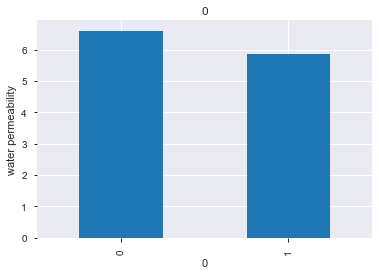

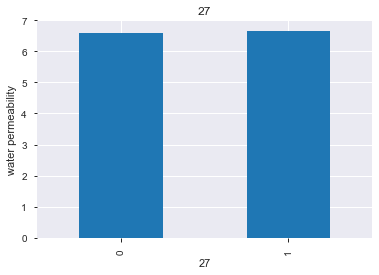

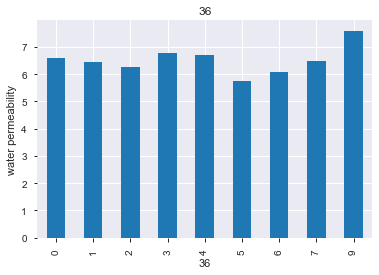

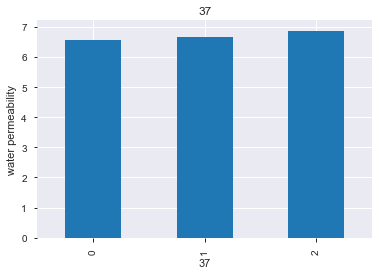

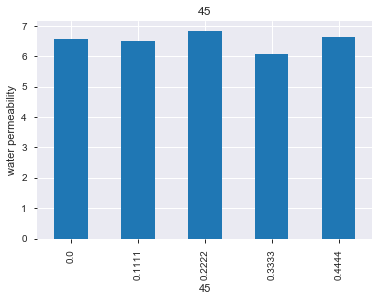

...

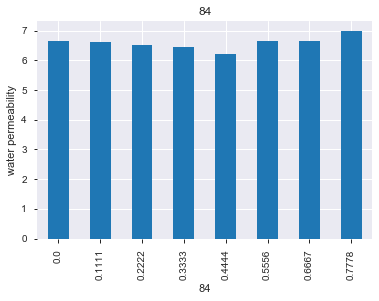

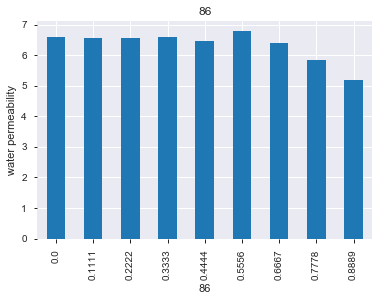

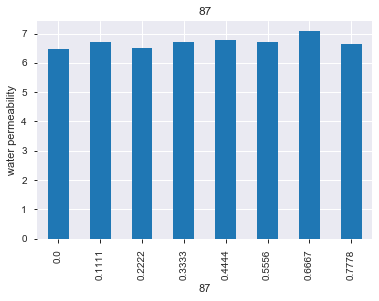

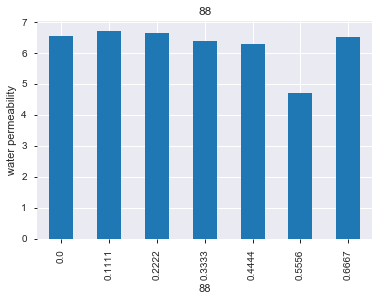

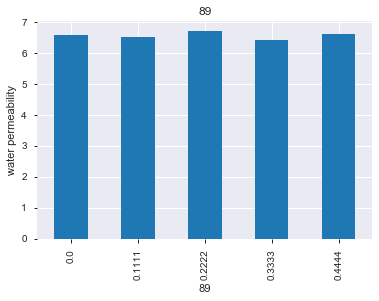

In [10]:
def analyse_discrete(df, var):
    df = df.copy()
    df.groupby(var)['target'].median().plot.bar()
    plt.title(var)
    plt.ylabel('water permeability')
    plt.show()
    
for var in discrete_vars:
    analyse_discrete(data, var)

We see that on most of them there is a relationship between the variable and the water permeability, but this relationship is not always monotonic.

For example, for the feature 37, there is a monotonic relationship: the higher the value, the higher the water permeability.
However, for many of the features, the relationship is not monotonic. 

If we were about to use a linear model we could try to we engineer these variables to extract the most for a linear model.
There are ways to re-arrange the order of the discrete values of a variable, to create a monotonic relationship between the variable and the target. However, as we are planing to use k nearest neighbours, we will not do that.

#### Continuous variables

Let's go ahead and find the distribution of the "continuous" variables.

In [11]:
# list of continuous variables
cont_vars = [var for var in num_vars if var not in discrete_vars]

print('Number of continuous variables: ', len(cont_vars))

Number of continuous variables:  59


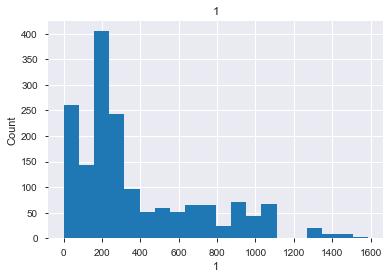

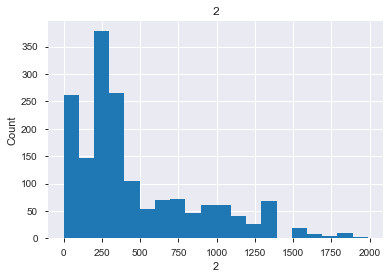

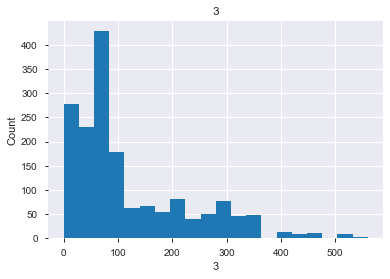

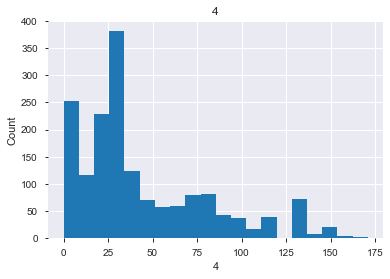

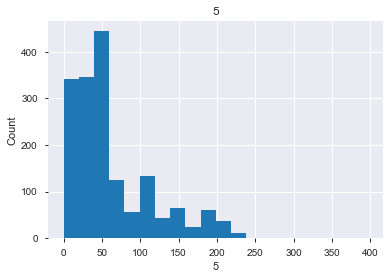

...

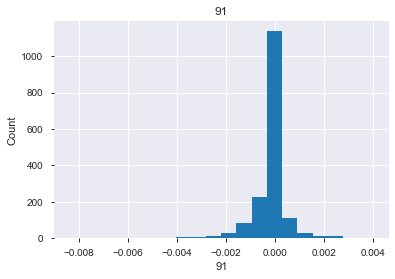

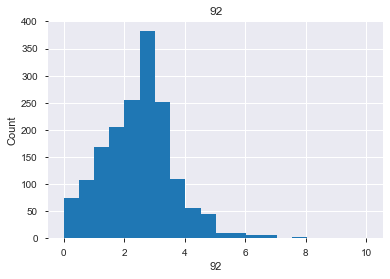

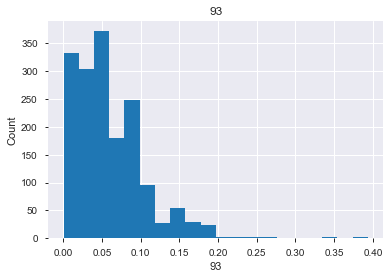

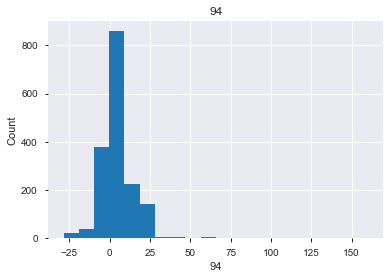

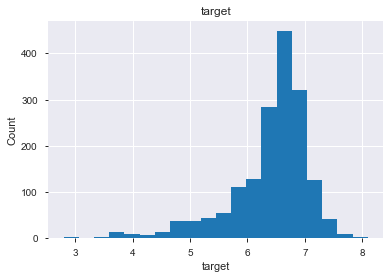

In [12]:
# Let's analyse the distributions of these variables
def analyse_continous(df, var):
    df = df.copy()
    df[var].hist(bins=20)
    plt.ylabel('Count')
    plt.xlabel(var)
    plt.title(var)
    plt.show()
    
for var in cont_vars:
    analyse_continous(data, var)

We see that some of the above variables, are not normally distributed. For linear models to perform best, we should definitly try to improve those non-Gaussian distributions (for example with a log transformation). As we are going to use k nearest neighbors we will ignore that for now.

#### Outliers

An outlier is a data point which is significantly different from the remaining data. "An outlier can be also generated by mechanical errors, measurement error or anything else that shouldn't be generalised. Those outliers could affect the algorithms and mislead the predictions. Sometimes it is a good idea to remove or preprocess outliers before feeding the data to the modeling algorithm.

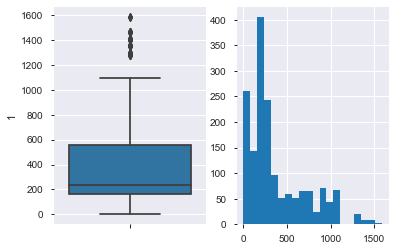

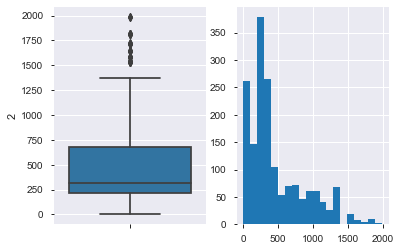

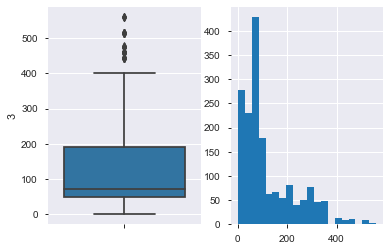

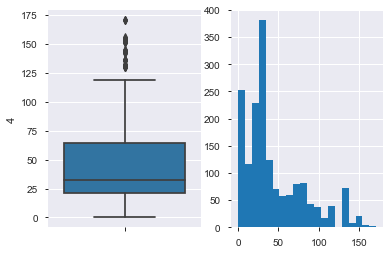

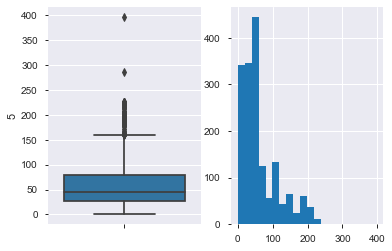

...

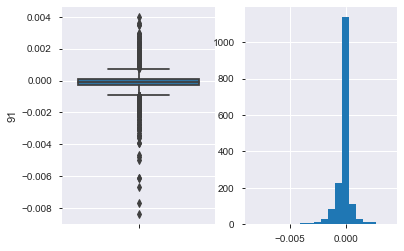

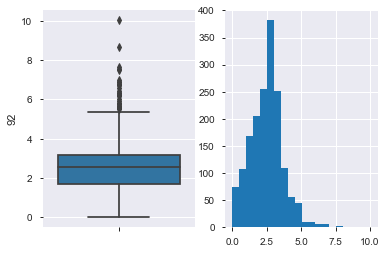

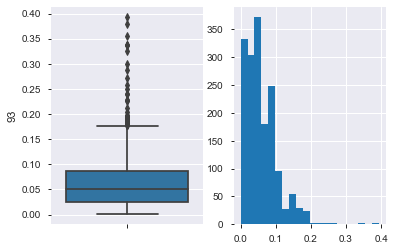

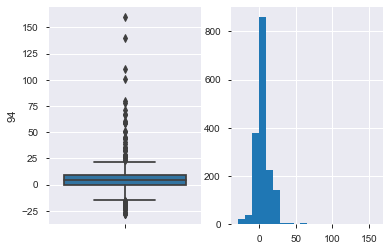

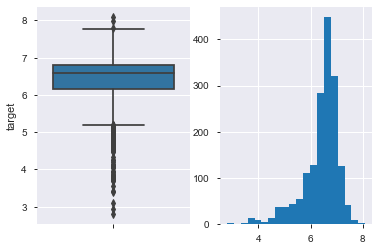

In [13]:
# let's make boxplots to visualise outliers in the continuous variables 

def box_plot(df, variable):
    plt.figure(figsize=(6,4))
    plt.subplot(1, 2, 1)
    fig = sns.boxplot(y=df[variable])
    
    plt.subplot(1, 2, 2)
    fig = data[var].hist(bins=20)

    plt.show()
   
    
for var in cont_vars:
    box_plot(data, var)

The majority of the continuous variables seem to contain outliers. Later on we will try to engineer/remove those outliers to see if it helps to improve our model performance.



To summarise, from this EDA we got some ideas that could help to improve the prediction power of our model:
- Preprocessing of outliers
- Feature filtering methods for:
    - Highly coorelated variables
    - Quasi-constant variables
